In [1]:
import sys
import os
sys.path = [p for p in sys.path if "ParaView" not in p]
sys.path.append("/home/haseeb/Notebooks/Parametric_DMD_cylinder_2D_modules")



import torch as pt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.tri as mtri
from flowtorch import DATASETS
from flowtorch.data import FOAMDataloader, mask_box
from pydmd import DMD, HODMD, ParametricDMD
from ezyrb import POD, Database, RBF, GPR, Linear
import seaborn as sns


from pathlib import Path
import re
# For High Quality Visuals
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 160  # crisp visuals


Refer to the installation instructions at https://github.com/FlowModelingControl/flowtorch
If you are not using the TecplotDataloader, ignore this warning.


# Training and test paramter for the partitioned parametericDMD

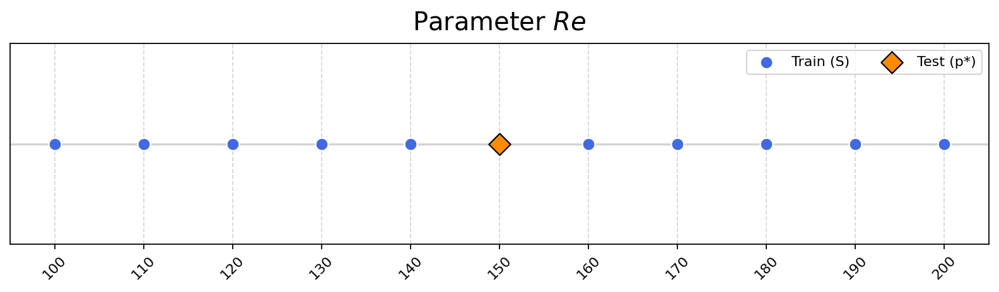

In [2]:
# Training and test parameters (parameter set P and test parameter μ*)

# Training parameter set P = {μ1, ..., μP}, i.e., Reynolds numbers
Re_list = np.array([100, 110, 120, 130, 140, 160, 170, 180, 190, 200])  # μ: training parameters

# Test parameter μ* (unseen Reynolds number)
Re_test = 150  # μ*: test parameter
# Global reference length and viscosity
L_ref = 0.1   # cylinder diameter [m]
nu = 1e-3     # kinematic viscosity [m^2/s] (example value, adjust to your case)

# Geometry parameters (from your blockMeshDict)
cylinderX = 0.2   # cylinder center x [m]
cylinderY = 0.2   # cylinder center y [m]
radius    = 0.05  # cylinder radius [m]


# Calculate reference velocities for non-dimensionalization directly from Re
U_ref_dict = {Re: Re * nu / L_ref for Re in Re_list}
U_ref_test = Re_test * nu / L_ref

# Visualization of parameter set S and test parameter p*
fig, ax = plt.subplots(figsize=(10, 3))
plt.title('Parameter $Re$', fontsize=18, pad=10)

# Plot all training parameters (S)
ax.scatter(Re_list, np.zeros_like(Re_list), 
           marker='o', s=80, color='royalblue', edgecolor='white', 
           label='Train (S)', zorder=3)

# Plot test parameter (p*)
ax.scatter(Re_test, 0, 
           marker='D', s=120, color='darkorange', edgecolor='black', 
           label='Test (p*)', zorder=4)

# Formatting
plt.xticks(np.append(Re_list, Re_test), rotation=45, fontsize=10)
plt.yticks([])
ax.axhline(0, color='lightgray', linewidth=1.5, zorder=1)   # baseline line
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.legend(ncols=2, frameon=True, fontsize=10)

plt.tight_layout()
plt.show()

In [3]:
# Load and prepare data

from Parameteric_DMD_cylinder_2D_modules.data_loader import (
    load_all_snapshots,
    add_test_parameter
)
import os

# Base folder containing simulation data
base_path = os.path.expanduser("~/OpenFOAM/test_1")

# Time windows
training_window = (10.0, 15.0)  # Time range for training snapshots
future_window = (15.0, 20.0)    # Time range for future prediction
test_window = (3.0, 20.0)       # Time range for test Reynolds number

# Sampling step for downsampling time steps
sampling_step = 1

# Load training and future snapshots for all training Reynolds numbers
data = load_all_snapshots(
    Re_list=Re_list,
    base_path=base_path,
    mask_box=mask_box,
    FOAMDataloader=FOAMDataloader,
    training_window=training_window,
    future_window=future_window,
    sampling_step=sampling_step
)

# Access all training and test data from the updated dictionary

snapshot_dict = data["snapshot_dict"]                 # velocity snapshots per Re
sampled_times_dict = data["sampled_times_dict"]       # time vectors per Re
snapshot_future_dict = data["snapshot_future_dict"]   # future snapshots (15–20s) per Re
sampled_times_future_dict = data["sampled_times_future_dict"]  # future time vectors per Re
masked_coords_dict = data["masked_coords_dict"]       # masked coordinates per Re
num_points_dict = data["num_points_dict"]             # number of spatial points per Re
mask_dict = data["mask_dict"]                         # spatial mask arrays per Re
loader_dict = data["loader_dict"]                     # FOAMDataloader instances per Re


# Add test snapshots for an unseen Reynolds number
path_test = f"{base_path}/cylinder_2D_Re{Re_test}"
data = add_test_parameter(
    data=data,
    Re=Re_test,
    path=path_test,
    mask_box=mask_box,
    FOAMDataloader=FOAMDataloader,
    time_window=test_window,
    sampling_step=sampling_step
)

# Access test data directly from unified dictionaries
snapshot_test   = snapshot_dict[Re_test]
num_points_test = num_points_dict[Re_test]
times_test      = sampled_times_dict[Re_test]
mask_test       = mask_dict[Re_test]
coords_test     = masked_coords_dict[Re_test]
loader_test     = loader_dict[Re_test]



INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor0/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor1/constant


Re=100: Masked points = 5746
Re=110: Masked points = 5746
Re=120: Masked points = 5746
Re=130: Masked points = 5746
Re=140: Masked points = 5746
Re=160: Masked points = 5746
Re=170: Masked points = 5746
Re=180: Masked points = 5746
Re=190: Masked points = 5746
Re=200: Masked points = 5746


INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor0/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor1/constant


All snapshots loaded.
Test Re=150: Loaded snapshot shape = (11492, 1701)


## Preprocess training snapshots: Subtract mean flow

In [4]:
from preprocess_snapshots import preprocess_snapshots

# Preprocess training and test datasets

train_snapshots, mean_flow_train, snapshot_processed_dict, mean_flow_test, snapshot_test_processed = preprocess_snapshots(
    snapshot_dict=snapshot_dict,
    Re_list=Re_list,
    snapshot_test=snapshot_test,
    times_test=times_test,
    train_window=training_window
)

# Print shapes of preprocessed data
print("Training mean flow shape:", mean_flow_train.shape)
print("Test mean flow shape:", mean_flow_test.shape)
print("Training snapshot array shape:", train_snapshots.shape)

for Re in Re_list:
    print(f"Re={Re}: processed shape = {snapshot_processed_dict[Re].shape}")
    
print(f"Re={Re_test}: raw test snapshot shape = {snapshot_test.shape}")
print(f"Re={Re_test}: processed test snapshot shape = {snapshot_test_processed.shape}")

Training mean flow shape: (11492,)
Test mean flow shape: (11492,)
Training snapshot array shape: (10, 11492, 501)
Re=100: processed shape = (11492, 501)
Re=110: processed shape = (11492, 501)
Re=120: processed shape = (11492, 501)
Re=130: processed shape = (11492, 501)
Re=140: processed shape = (11492, 501)
Re=160: processed shape = (11492, 501)
Re=170: processed shape = (11492, 501)
Re=180: processed shape = (11492, 501)
Re=190: processed shape = (11492, 501)
Re=200: processed shape = (11492, 501)
Re=150: raw test snapshot shape = (11492, 1701)
Re=150: processed test snapshot shape = (11492, 501)


/home/haseeb/Notebooks/Parametric_DMD_cylinder_2D_modules/visualization_utilities.py:34: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=16)


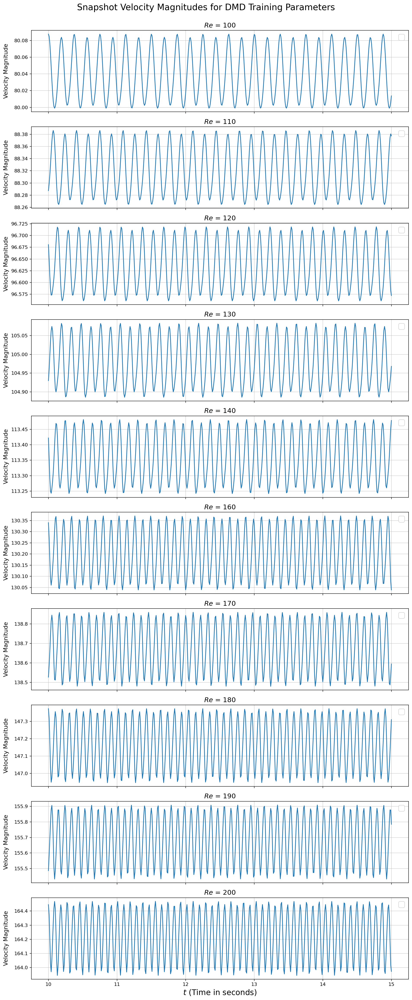

In [5]:
# Snapshot magnitude over time for each Parameter i.e., Reynolds number

import logging
from visualization_utilities import plot_snapshot_magnitudes

# Suppress INFO messages from flowtorch FOAMDataloader
logging.getLogger("flowtorch.data.foam_dataloader").setLevel(logging.WARNING)

loader_dict = data["loader_dict"]

plot_snapshot_magnitudes(snapshot_dict, sampled_times_dict, Re_list)



## Offline Phase

## Step 1: Perform POD and DMD on the concatenated snapshot matrix X1

Available noise levels: [0, 10, 20, 40]


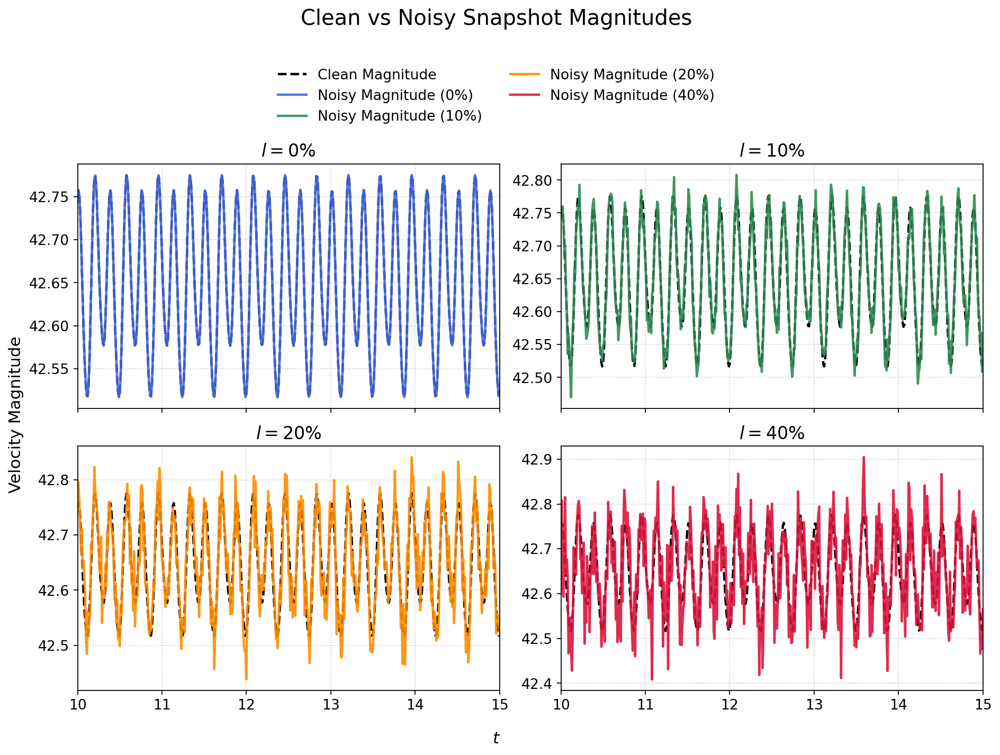

In [6]:
# Add and visualize the Gaussian noise to the snapshot matrix


from dmd_snapshot_noise_analysis import (
    generate_noisy_snapshots,
    plot_noisy_snapshot_magnitudes
)

# Define noise levels to test
noise_levels = [0, 10, 20, 40]

# Generate noisy versions of the training snapshots
snapshot_noisy_dict = generate_noisy_snapshots(train_snapshots, noise_levels=noise_levels)

print("Available noise levels:", list(snapshot_noisy_dict.keys()))

# Visualize clean vs noisy magnitudes for the first Reynolds number
plot_noisy_snapshot_magnitudes(
    train_snapshots=train_snapshots,
    snapshot_noisy_dict=snapshot_noisy_dict,
    sampled_times_dict=sampled_times_dict,
    Re_list=Re_list,
    param_index=0   # index of Re_list to visualize
)


In [ ]:
# POD and Parametric DMD

from dmd_snapshot_noise_analysis import train_parametric_dmd_with_noise

pdmd_models, cached_modal_coeffs, cached_roms = train_parametric_dmd_with_noise(
    train_snapshots=train_snapshots,
    Re_list=Re_list,
    noise_levels=[0, 10, 20, 40],
    pod_rank=30,
    pod_method="randomized_svd"
)



Training ParametricDMD with 0% noise...


/home/haseeb/ml-cfd-lecture/ml-cfd/lib/python3.12/site-packages/pydmd/snapshots.py:73: UserWarning: Input data condition number 1760944.430040884. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
/home/haseeb/ml-cfd-lecture/ml-cfd/lib/python3.12/site-packages/pydmd/snapshots.py:73: UserWarning: Input data condition number 1088279.6180835953. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
/home/haseeb/ml-cfd-lecture/ml-cfd/lib/python3.12/site-packages/pydmd/snapshots.py:73: UserWarning: Input data condition number 425616.73594065895. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
/home/haseeb/ml-cfd-lecture/ml-cfd/lib/python3.12/site-packages/pydmd/snap


Training ParametricDMD with 10% noise...


INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)



Training ParametricDMD with 20% noise...


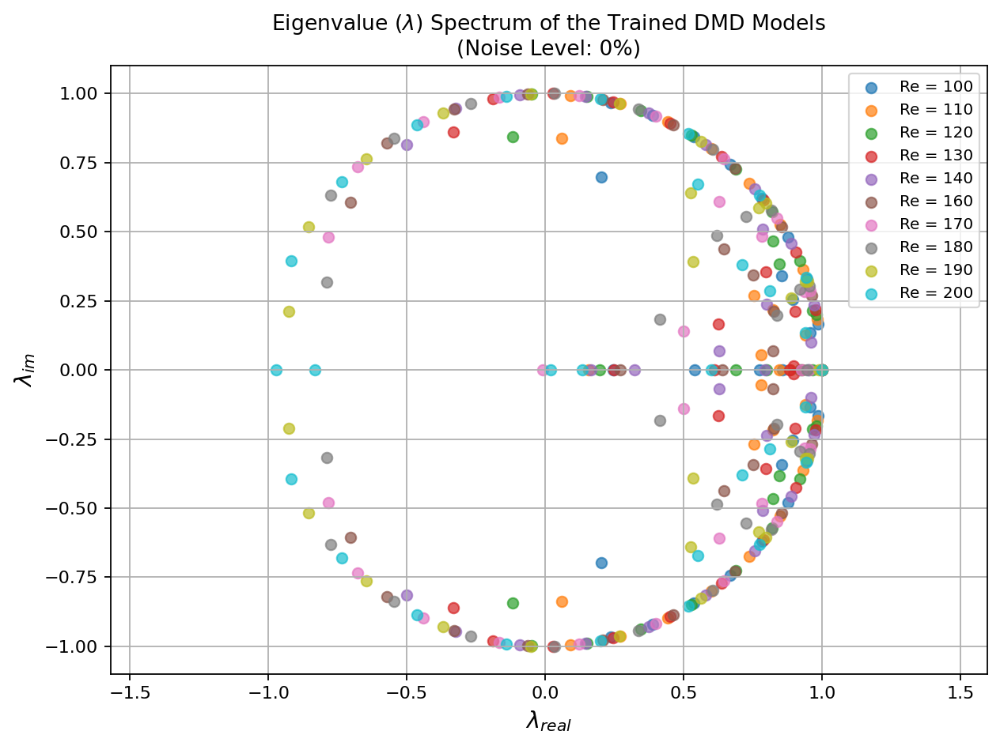

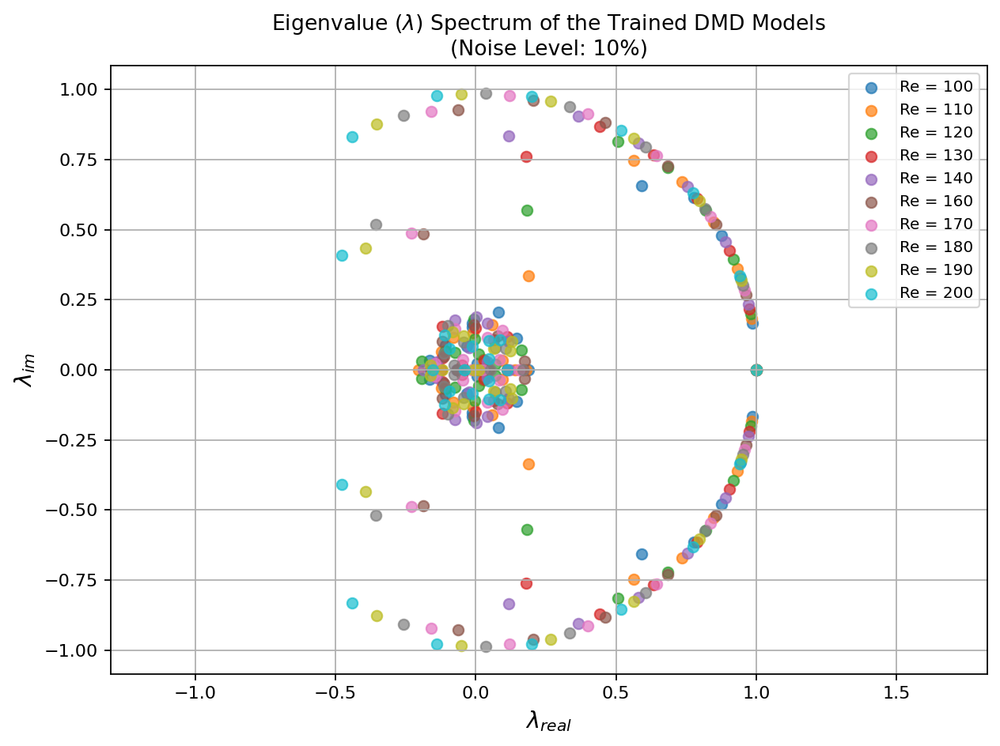

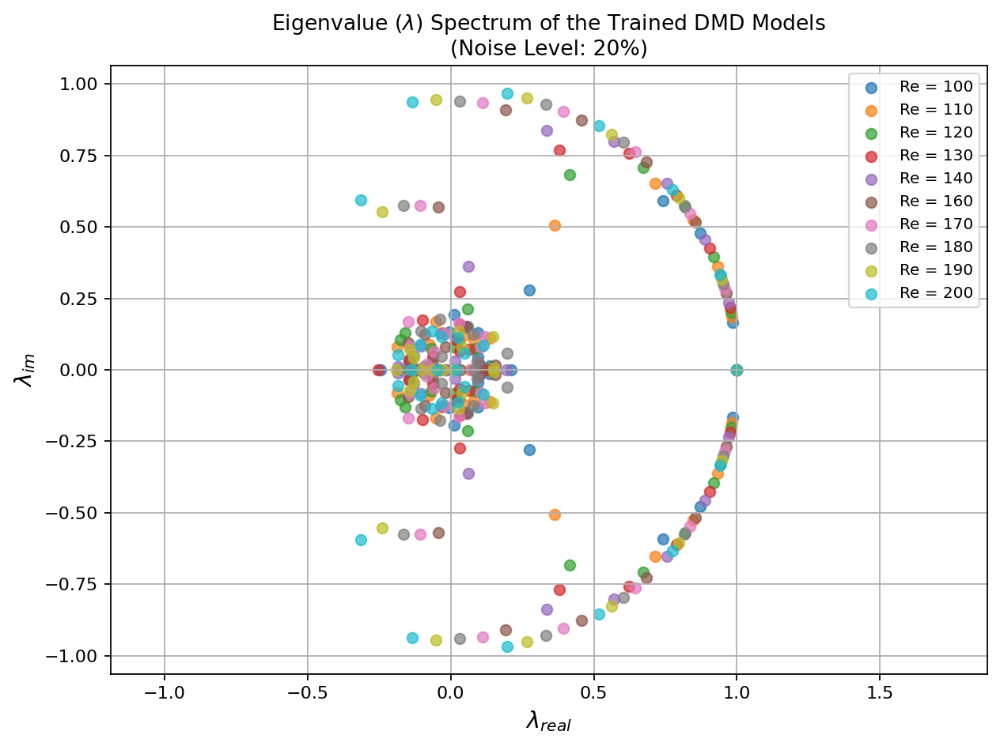

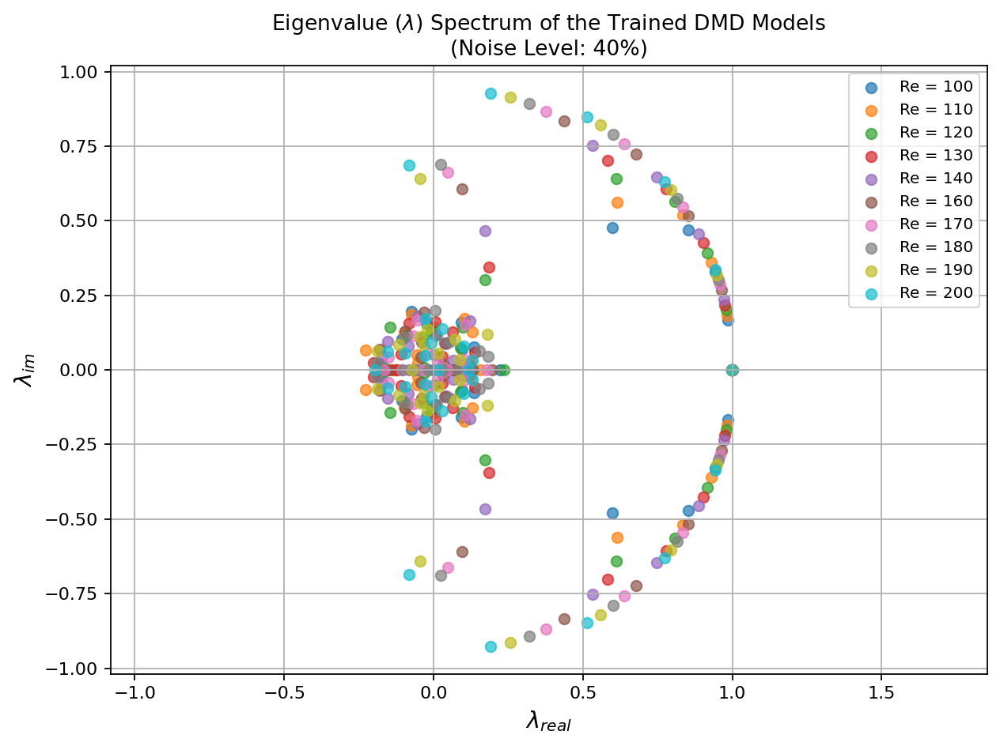

In [ ]:
# Eigenvalue spectrum plots for all trained DMD models (per noise level)

for level, model in pdmd_models.items():
    plt.figure(figsize=(8, 6))
    for i, dmd in enumerate(model._dmd):
        eigs = dmd.eigs
        Re = Re_list[i]
        plt.scatter(np.real(eigs), np.imag(eigs),
                    label=f"Re = {Re}", alpha=0.7)
    plt.xlabel("$λ_{real}$", fontsize=13)
    plt.ylabel("$λ_{im}$", fontsize=13)
    plt.title(f"Eigenvalue ($λ$) Spectrum of the Trained DMD Models \n(Noise Level: {level}%)")
    plt.grid(True)
    plt.axis("equal")
    plt.legend(loc="best", fontsize=9)
    plt.tight_layout()
    plt.show()





Modal Coefficient Comparison at Re = 160 (Noise Level: 0%)


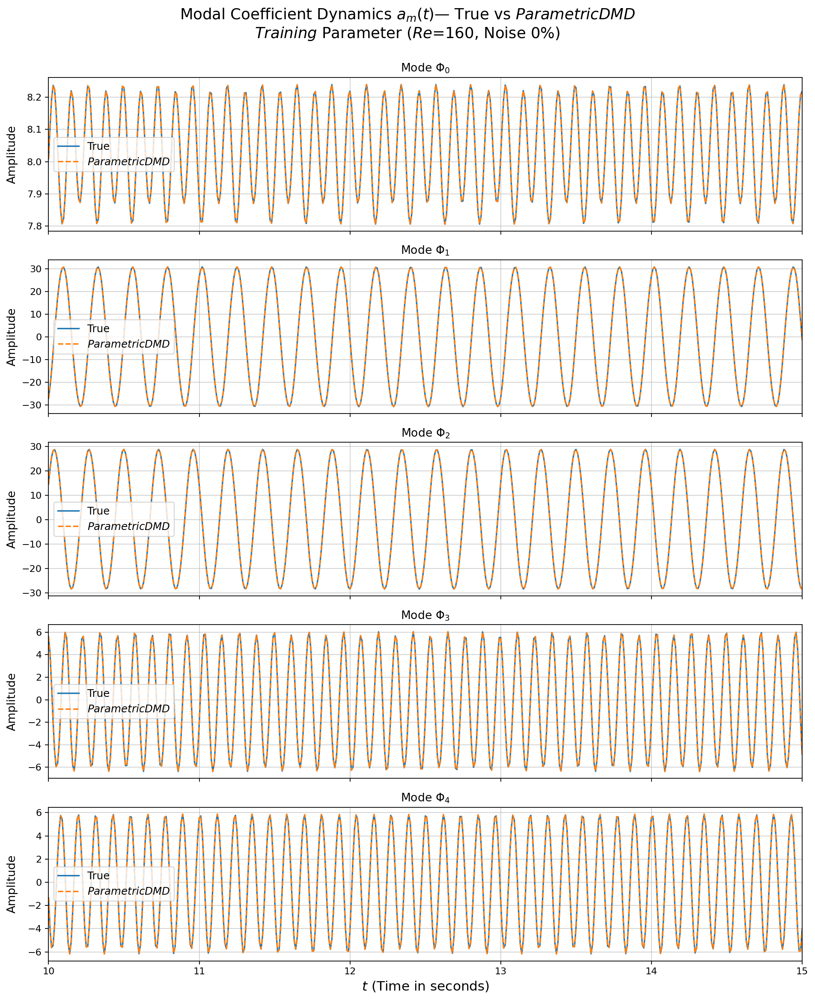


Modal Coefficient Comparison at Re = 160 (Noise Level: 10%)


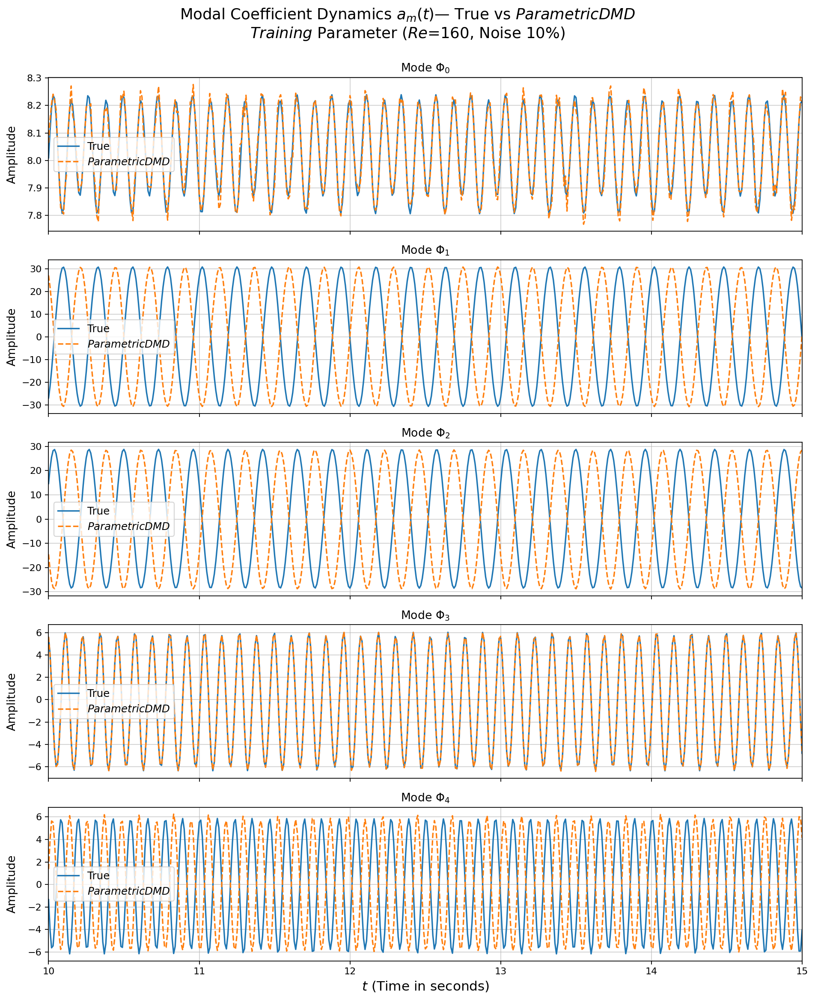


Modal Coefficient Comparison at Re = 160 (Noise Level: 20%)


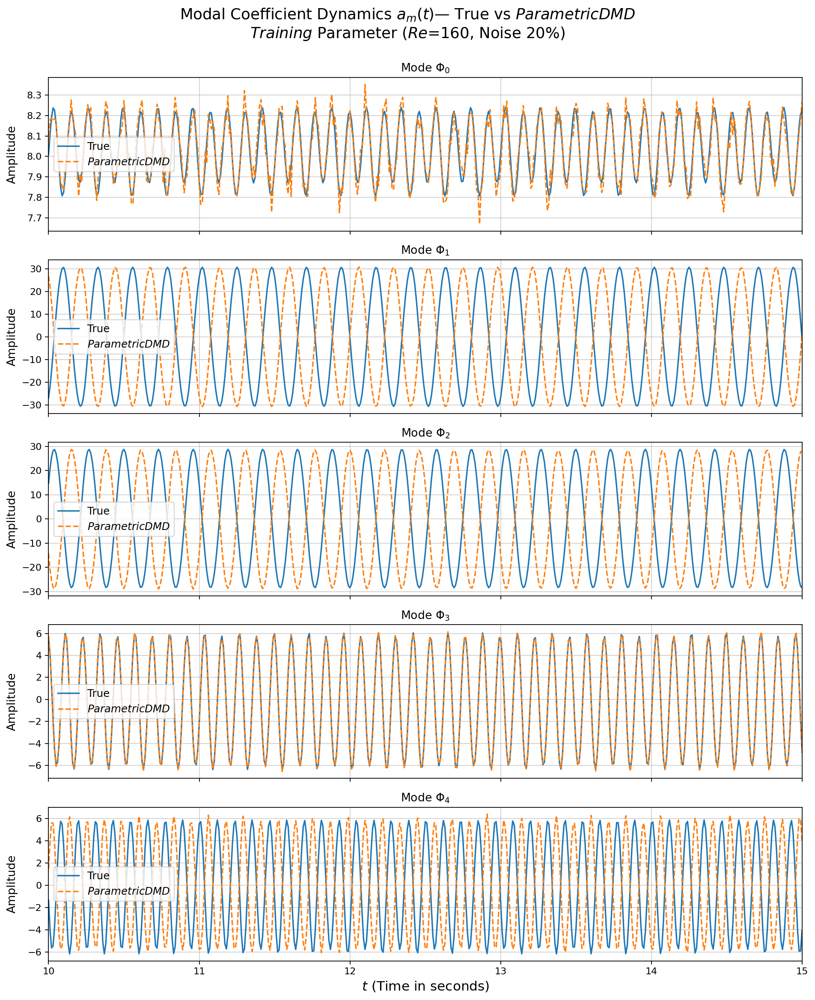


Modal Coefficient Comparison at Re = 160 (Noise Level: 40%)


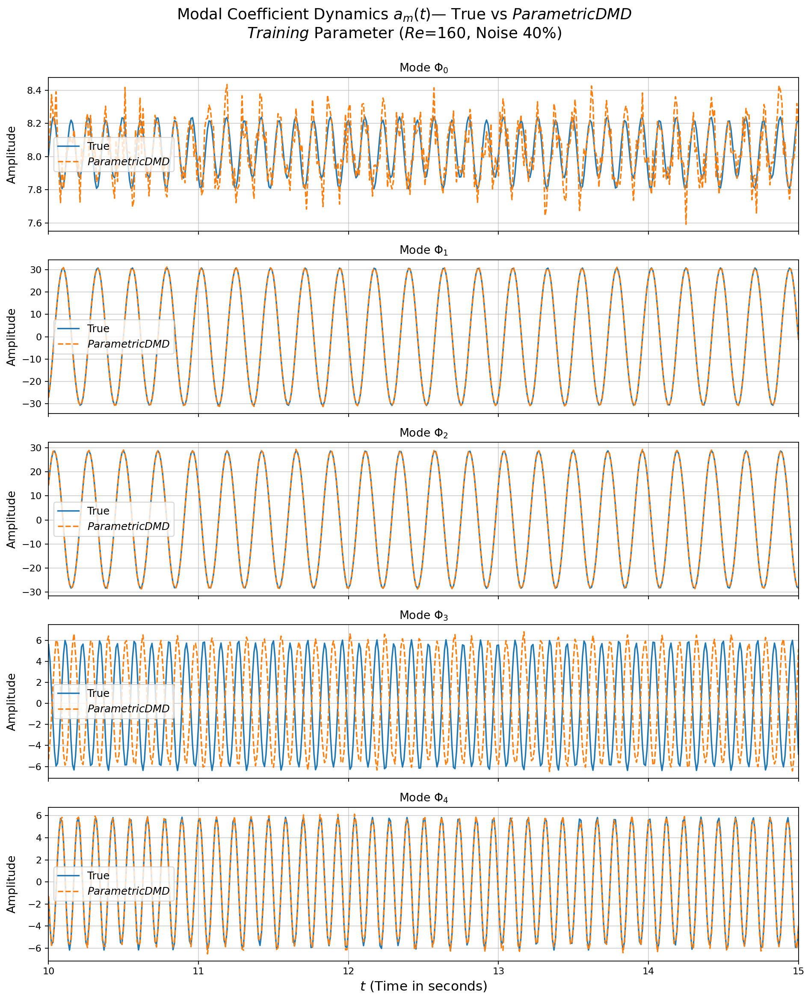

In [ ]:
# Plot comparison of DMD modal coefficients for a training parameter i.e., Reynolds number

from visualization_utilities_snapshot_noise import plot_dmd_modal_comparison

plot_dmd_modal_comparison(
    pdmd_models=pdmd_models,
    Re_list=Re_list,
    sampled_times_dict=sampled_times_dict,
    cached_modal_coeffs=cached_modal_coeffs,
    Re_target=160,
    n_modes_to_plot=5
)



FFT of Training Modal Coefficients at Re = 160 (Noise Level: 0%)


/home/haseeb/Notebooks/Parametric_DMD_cylinder_2D_modules/visualization_utilities_snapshot_noise.py:270: ComplexWarning: Casting complex values to real discards the imaginary part
  fft_dmd  = np.abs(np.fft.rfft(np.asarray(modal_dmd[mode],  dtype=np.float64)))


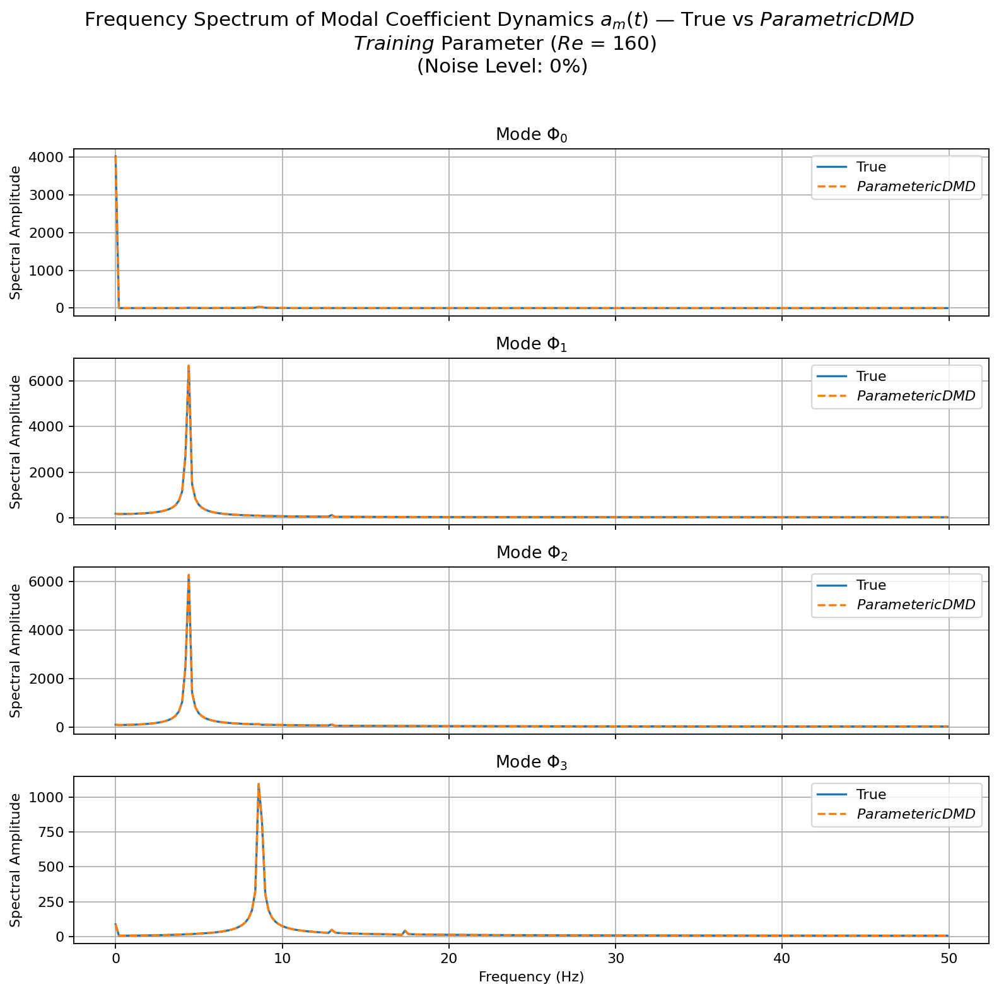


FFT of Training Modal Coefficients at Re = 160 (Noise Level: 10%)


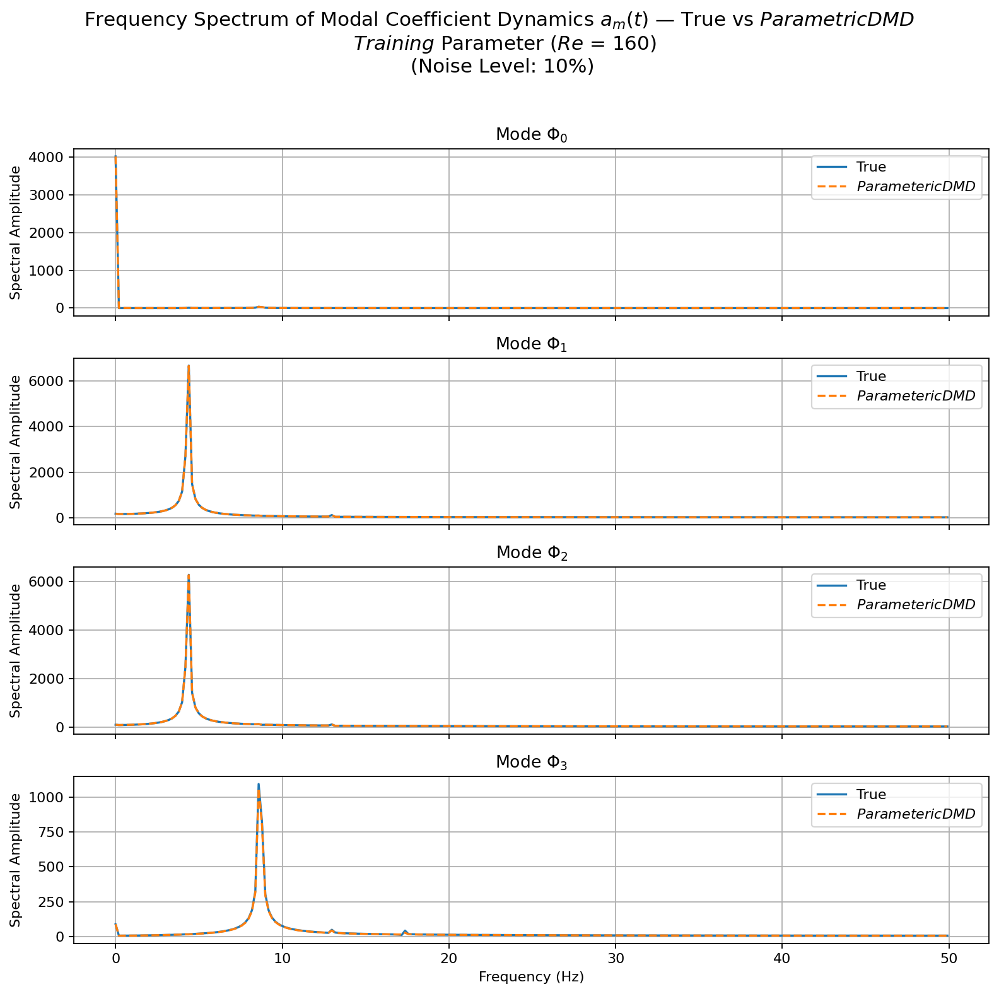


FFT of Training Modal Coefficients at Re = 160 (Noise Level: 20%)


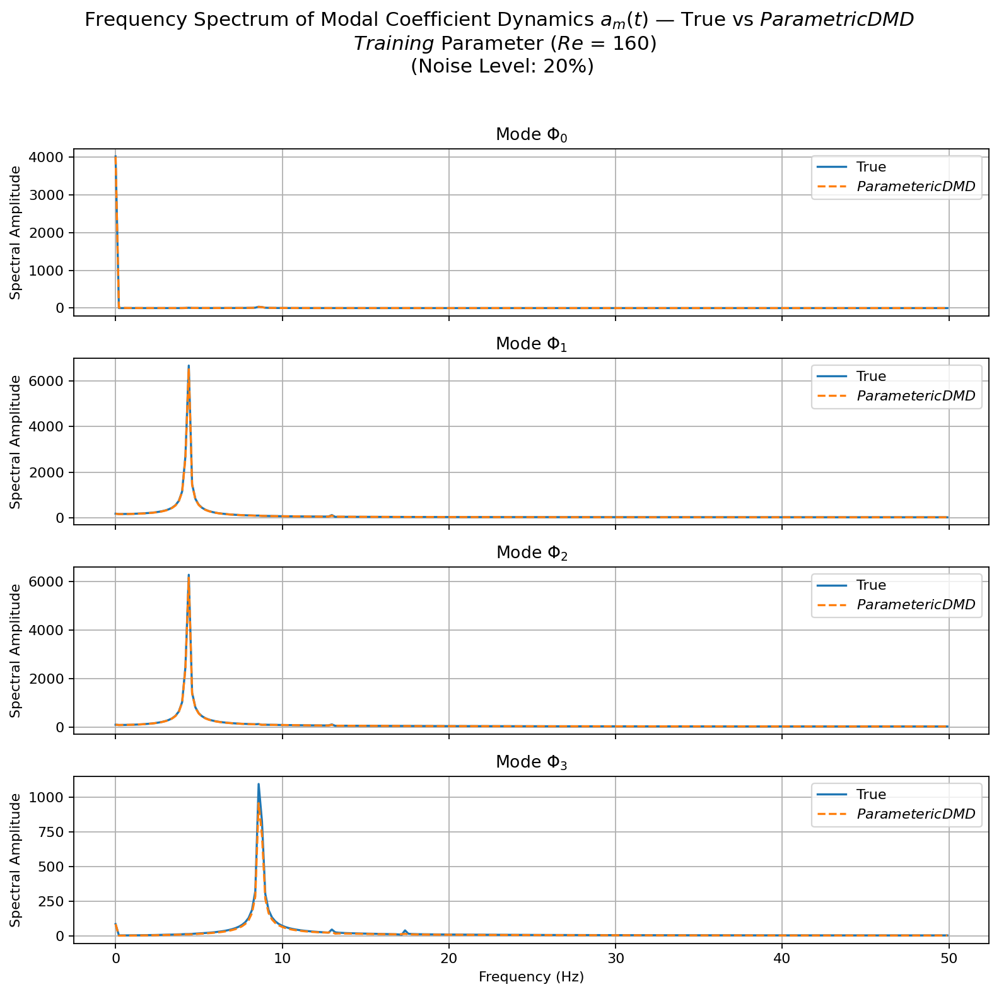


FFT of Training Modal Coefficients at Re = 160 (Noise Level: 40%)


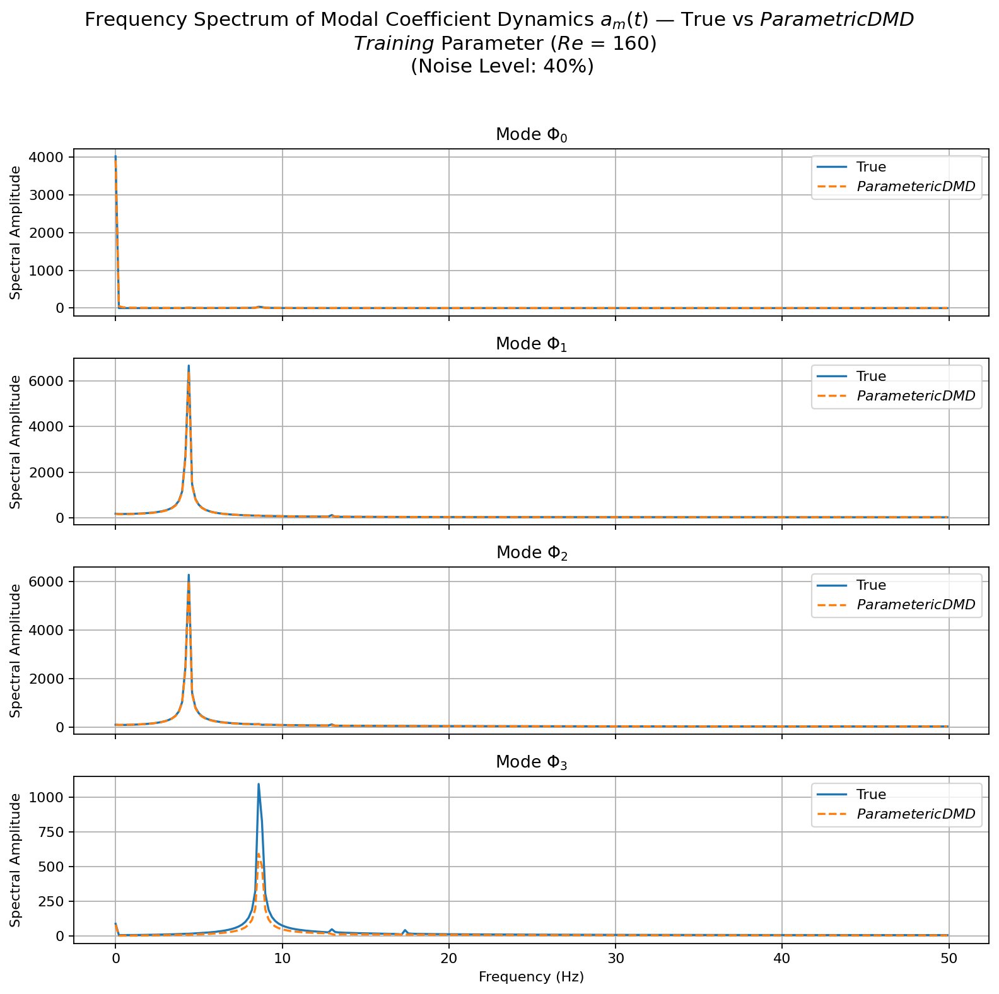

In [ ]:
# Plot comparison FFT of DMD modal coefficients for a training parameter i.e., Reynolds number

from visualization_utilities_snapshot_noise import plot_dmd_fft_comparison

plot_dmd_fft_comparison(
    pdmd_models=pdmd_models,
    Re_list=Re_list,
    cached_modal_coeffs=cached_modal_coeffs,
    Re_target=160,
    n_modes_to_plot=4,
    dt=0.01
)

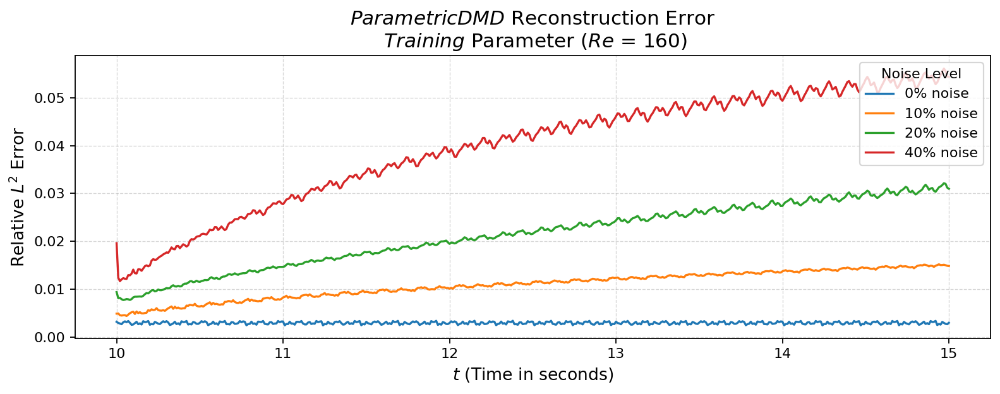

In [ ]:
# Plot relative L2 reconstruction error over time for a training parameter i.e., Reynolds number

from visualization_utilities_snapshot_noise import plot_dmd_reconstruction_error

plot_dmd_reconstruction_error(
    pdmd_models=pdmd_models,
    Re_list=Re_list,
    sampled_times_dict=sampled_times_dict,
    snapshot_processed_dict=snapshot_processed_dict,
    mean_flow_train=mean_flow_train,
    Re_target=160
)


## Online Phase

## Step 2: Forecasting and interpolation for unkonwn Reynolds number

In [ ]:
# Define test Reynolds number
Re_test = 150

# Use sampled times from the first Re in training list
training_times = np.array(sampled_times_dict[Re_list[0]], dtype=float)

# Loop over all noise-level models
for level, pdmd in pdmd_models.items():
    # Step 1: Define forecasting time range
    pdmd.dmd_time["t0"]   = pdmd.original_time["tend"]
    pdmd.dmd_time["tend"] = pdmd.original_time["tend"] + 500 - 1e-12
    pdmd.dmd_time["dt"]   = pdmd.original_time["dt"]

    # Step 2: Set target Re for interpolation
    pdmd.parameters = np.array([[Re_test]])

    # Step 3: Trigger reconstruction (includes forecasting)
    forecasted_snapshots = pdmd.reconstructed_data  # shape: (1, space_dim, time_steps)
    forecasted_field = forecasted_snapshots[0]

    # Step 4: Print diagnostics
    print(f"\nNoise level {level}%:")
    print(
        f"Forecasting from t = {pdmd.dmd_time['t0']} to t = {pdmd.dmd_time['tend']} "
        f"with Δt = {pdmd.dmd_time['dt']}"
    )
    print("Time vector:", pdmd.dmd_timesteps[:10], "...")
    print("Forecasted field shape:", forecasted_field.shape)



Noise level 0%:
Forecasting from t = 500 to t = 999.999999999999 with Δt = 1
Time vector: [500. 501. 502. 503. 504. 505. 506. 507. 508. 509.] ...
Forecasted field shape: (11492, 501)

Noise level 10%:
Forecasting from t = 500 to t = 999.999999999999 with Δt = 1
Time vector: [500. 501. 502. 503. 504. 505. 506. 507. 508. 509.] ...
Forecasted field shape: (11492, 501)

Noise level 20%:
Forecasting from t = 500 to t = 999.999999999999 with Δt = 1
Time vector: [500. 501. 502. 503. 504. 505. 506. 507. 508. 509.] ...
Forecasted field shape: (11492, 501)

Noise level 40%:
Forecasting from t = 500 to t = 999.999999999999 with Δt = 1
Time vector: [500. 501. 502. 503. 504. 505. 506. 507. 508. 509.] ...
Forecasted field shape: (11492, 501)


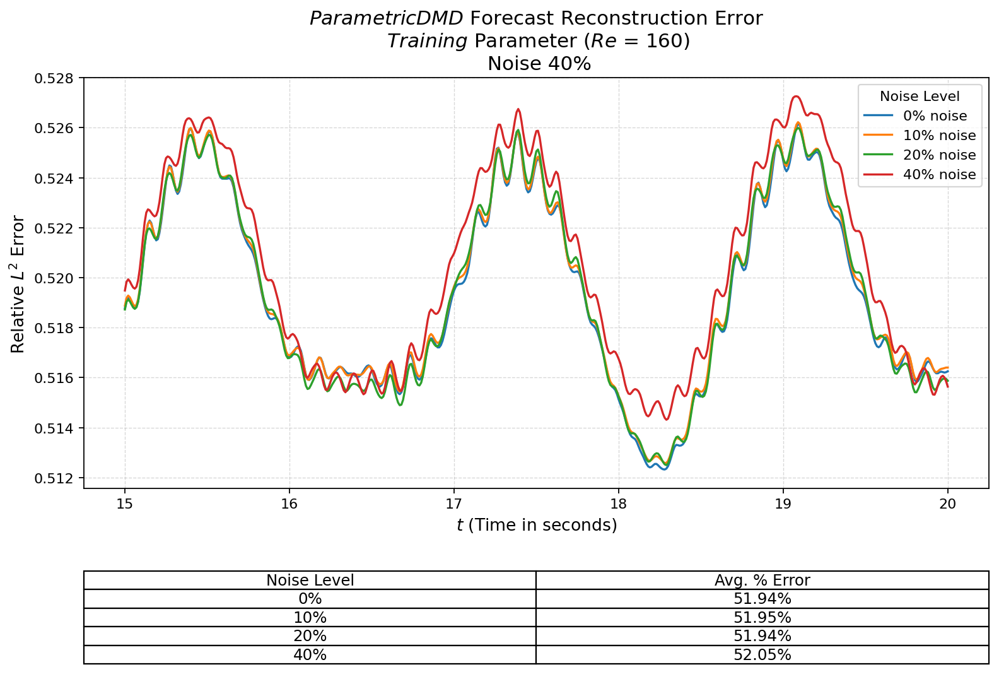

In [ ]:
# Plot relative L2 DMD reconstruction error over Forecast time for a training parameter i.e., Reynolds number


from visualization_utilities_snapshot_noise import plot_dmd_forecast_error
Re_target = 160
plot_dmd_forecast_error( pdmd_models, Re_target, snapshot_future_dict, sampled_times_future_dict, mean_flow_train)


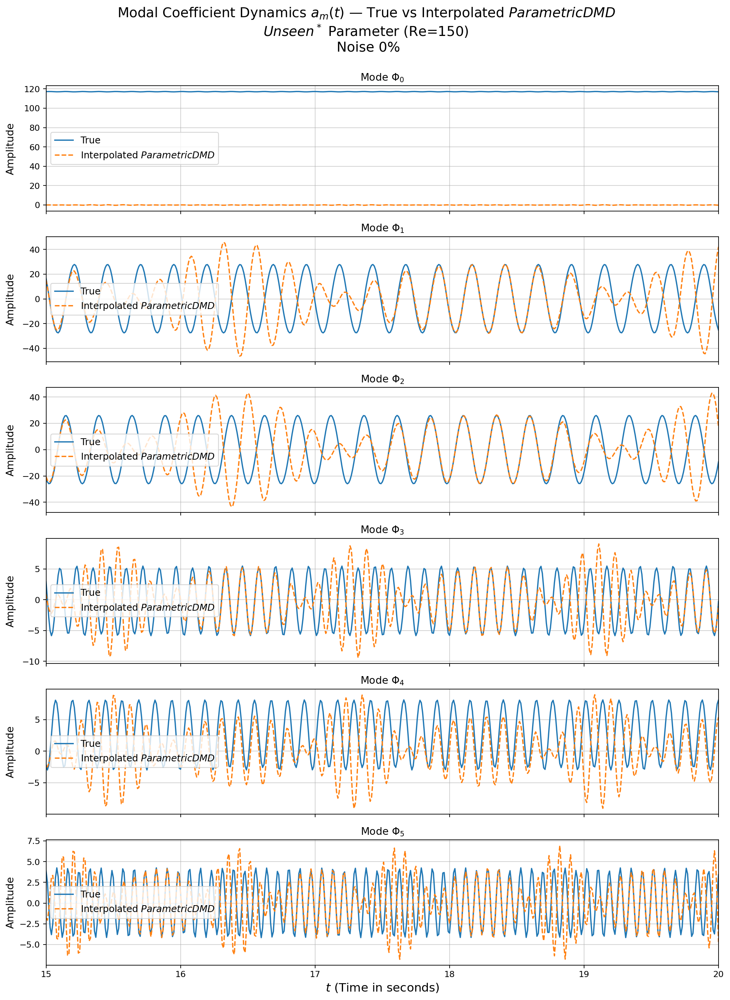

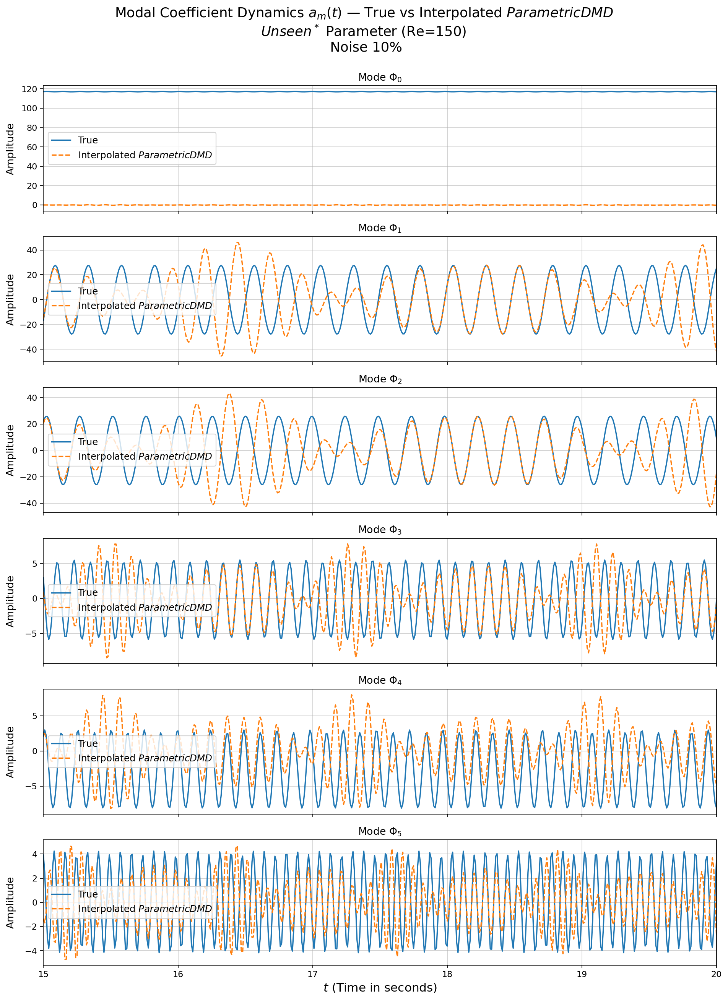

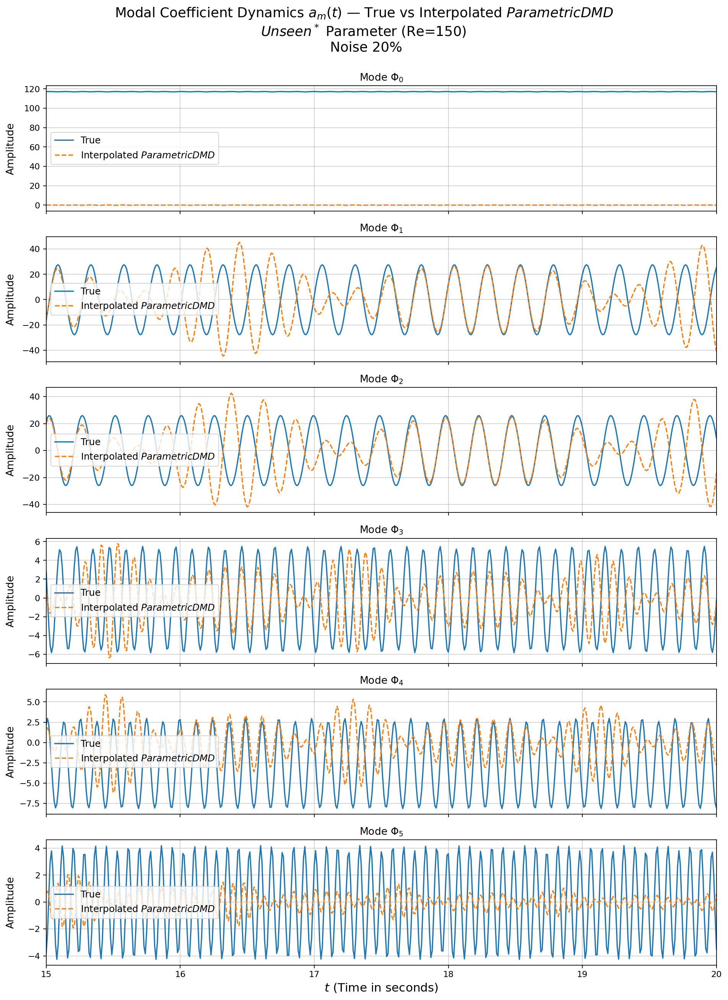

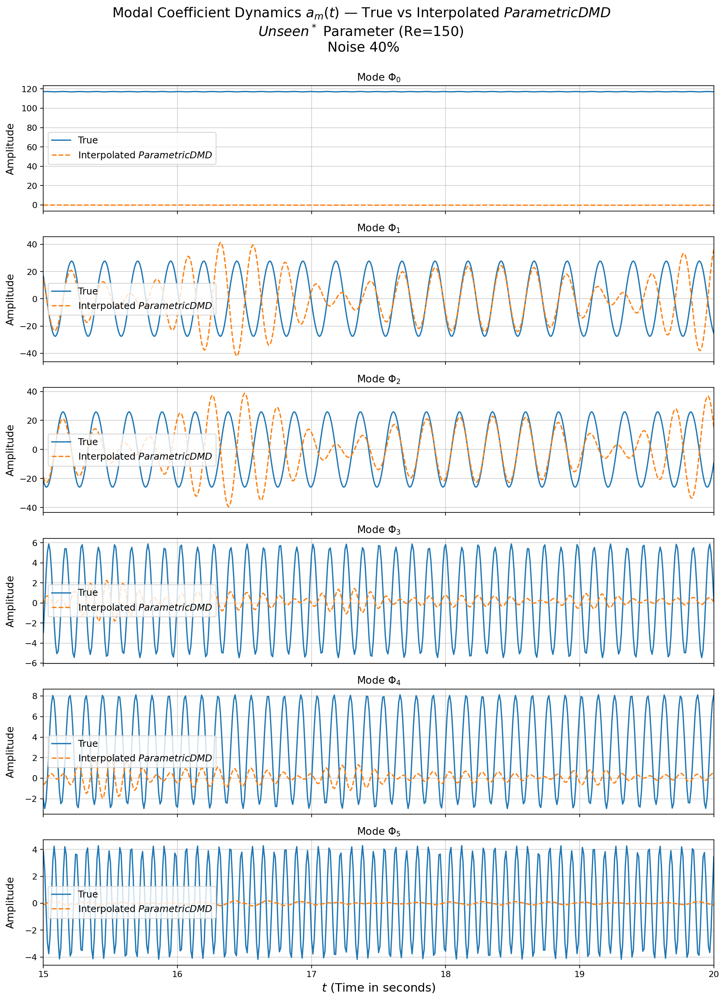

In [ ]:
# Plot comparison of DMD modal coefficients for unseen parameter i.e., Reynolds numbers

from visualization_utilities_snapshot_noise import plot_dmd_modal_comparison_interp_vs_true

plot_dmd_modal_comparison_interp_vs_true(
    pdmd_models=pdmd_models,
    snapshot_test=snapshot_test,          # snapshots for Re_test
    loader_test=loader_test,              # FOAMDataloader with write_times
    Re_test=Re_test,                      # e.g. 150
    dt_phys=0.01,
    t0_phys=15.0,
    n_modes_to_plot=6,
    time_window=(3.0, 20.0)
)



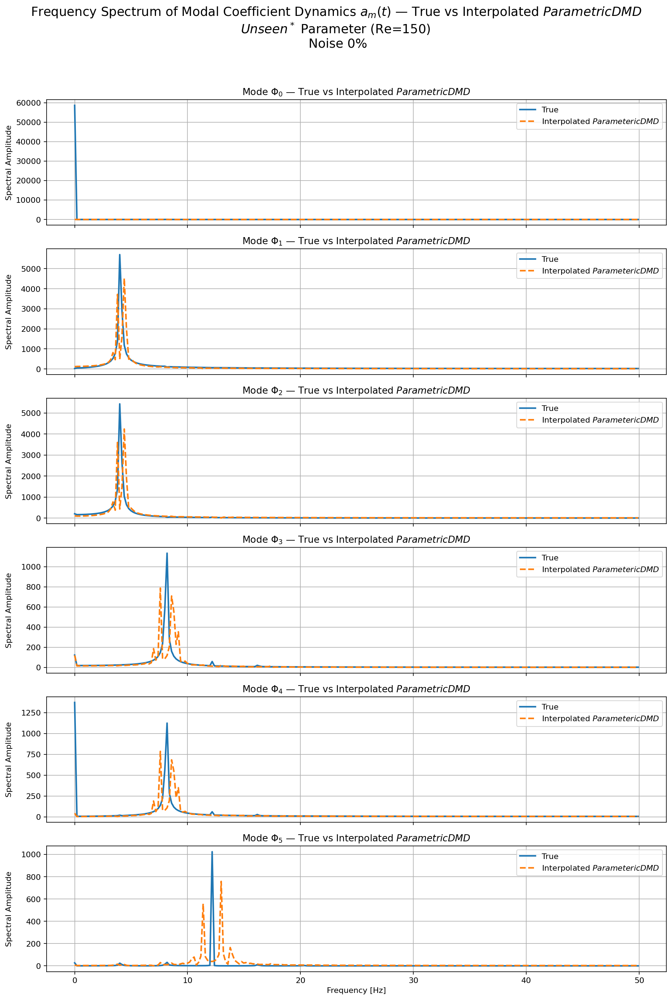

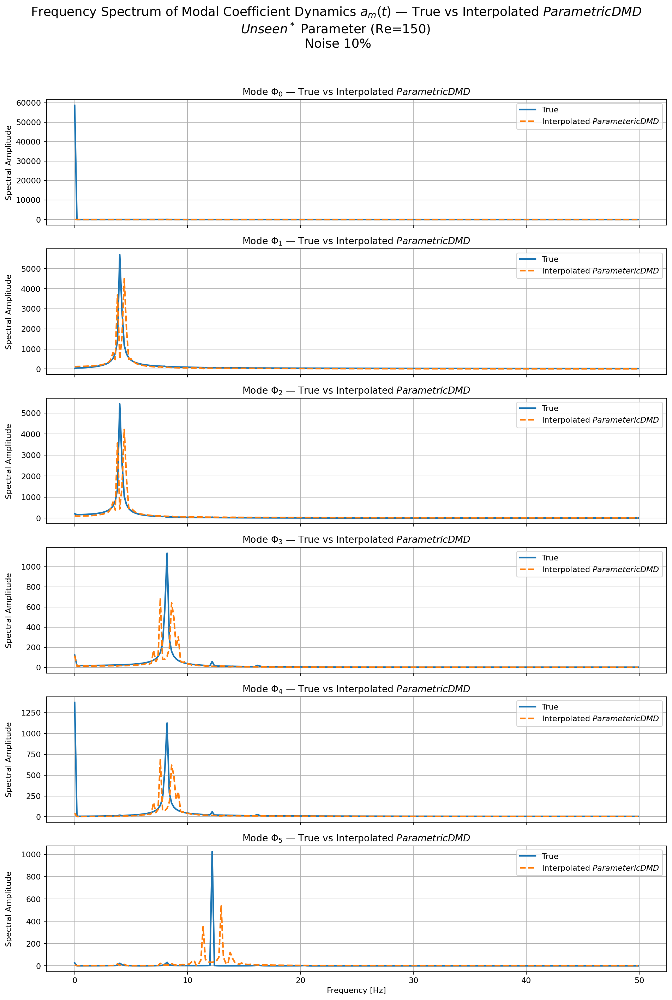

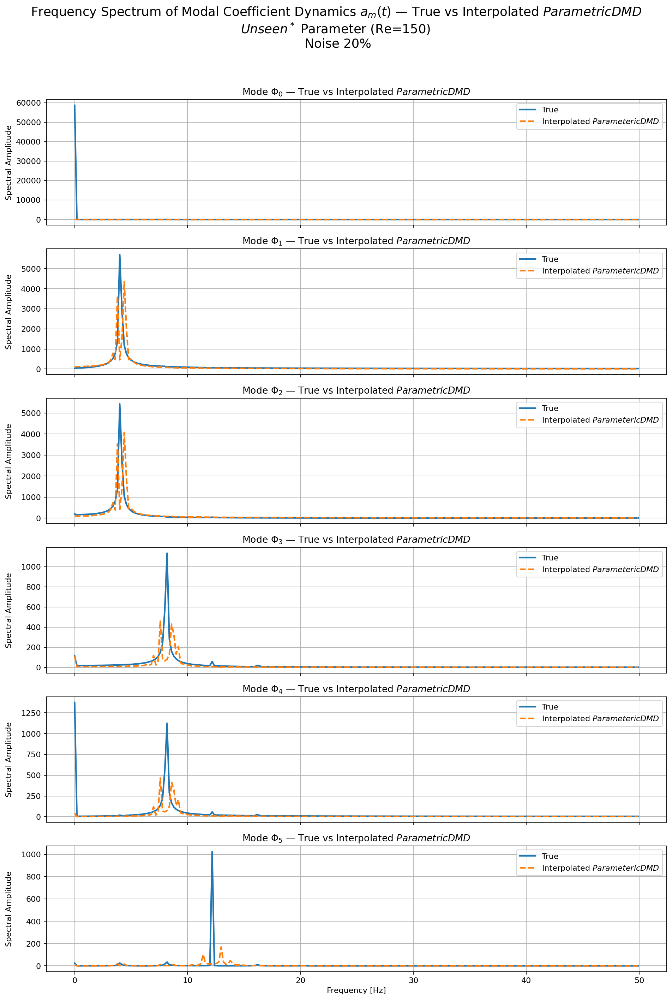

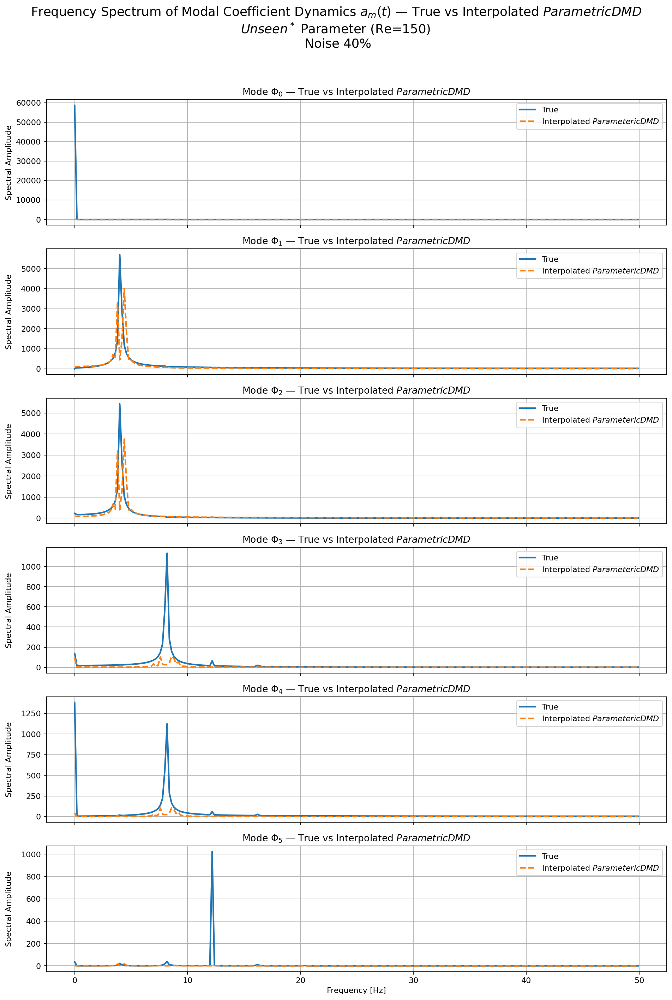

In [ ]:
# Plot comparison FFT of DMD modal coefficients for unseen parameter i.e., Reynolds numbers

from visualization_utilities_snapshot_noise import plot_fft_modal_comparison_interp_vs_true

plot_fft_modal_comparison_interp_vs_true(
    pdmd_models=pdmd_models,        # dict of ParametricDMD models keyed by noise level
    snapshot_test=snapshot_test,    # raw snapshot matrix for the unseen Re
    loader_test=loader_test,        # FOAMDataloader object with write_times
    Re_test=Re_test,                # e.g. 150
    dt_phys=0.01,                   # physical timestep
    t0_phys=15.0,                   # forecast start time
    n_modes_to_plot=6,              # number of modes to visualize
    time_window=(3.0, 20.0)         # restrict snapshots to this time range
)



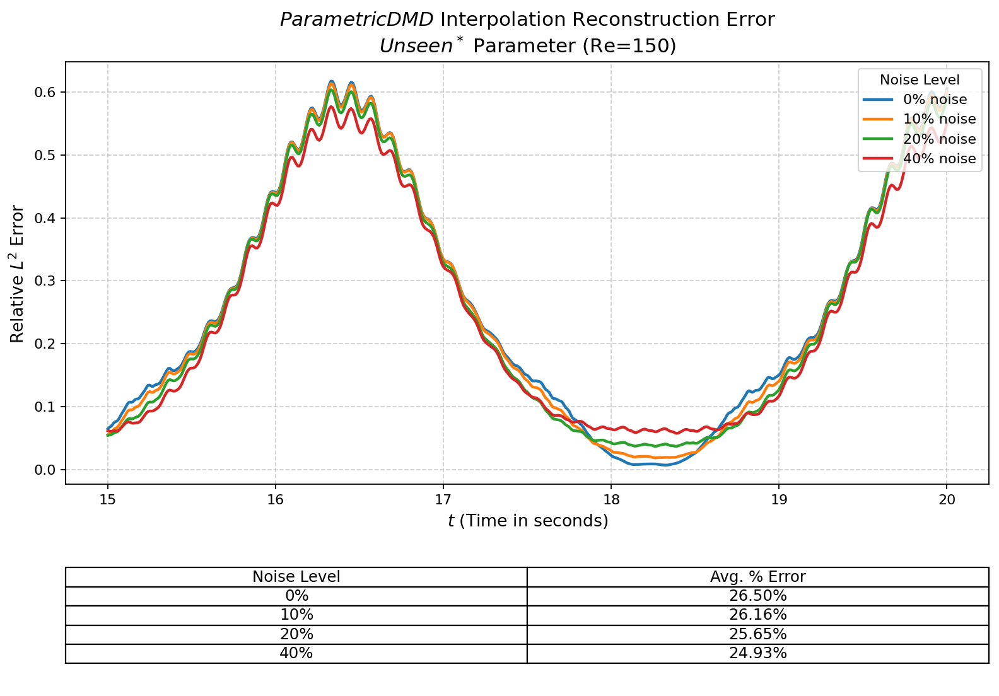

In [ ]:
# Plot ParametericDMD reconstruction error for unseen parameter i.e., Reynolds numbers

from visualization_utilities_snapshot_noise import plot_interp_reconstruction_error


plot_interp_reconstruction_error(
    snapshot_test=snapshot_test,
    times_test=times_test,
    pdmd_models=pdmd_models,
    dt_phys=0.01,
    Re_test=Re_test,
    mean_flow_test=mean_flow_test,
    t0_phys=15.0,
    time_window=(15.0, 20.0)
)
